In [16]:
!mamba install -y py3dep


                  __    __    __    __
                 /  \  /  \  /  \  /  \
                /    \/    \/    \/    \
███████████████/  /██/  /██/  /██/  /████████████████████████
              /  / \   / \   / \   / \  \____
             /  /   \_/   \_/   \_/   \    o \__,
            / _/                       \_____/  `
            |/
        ███╗   ███╗ █████╗ ███╗   ███╗██████╗  █████╗
        ████╗ ████║██╔══██╗████╗ ████║██╔══██╗██╔══██╗
        ██╔████╔██║███████║██╔████╔██║██████╔╝███████║
        ██║╚██╔╝██║██╔══██║██║╚██╔╝██║██╔══██╗██╔══██║
        ██║ ╚═╝ ██║██║  ██║██║ ╚═╝ ██║██████╔╝██║  ██║
        ╚═╝     ╚═╝╚═╝  ╚═╝╚═╝     ╚═╝╚═════╝ ╚═╝  ╚═╝

        mamba (0.22.1) supported by @QuantStack

        GitHub:  https://github.com/mamba-org/mamba
        Twitter: https://twitter.com/QuantStack

█████████████████████████████████████████████████████████████


Looking for: ['py3dep']

[+] 0.0s
[+] 0.1s
conda-forge/linux-64 ━━━━━━━━━━╸━━━━━━━━━━━━   0.0 B /  ??.?MB @  ??.

In [17]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import matplotlib.pyplot as plt
import xarray as xr
from datetime import datetime
import matplotlib
import ipyleaflet
import sys
import os
import dask_gateway
import planetary_computer
from rechunker import rechunk
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils

In [18]:
gj = '../input/shapefiles/mt_baker.geojson'
#gj = '../input/shapefiles/olympic_peninsula.geojson'
#gj = '../input/shapefiles/wa.geojson'
bbox_gdf = gpd.read_file(gj)

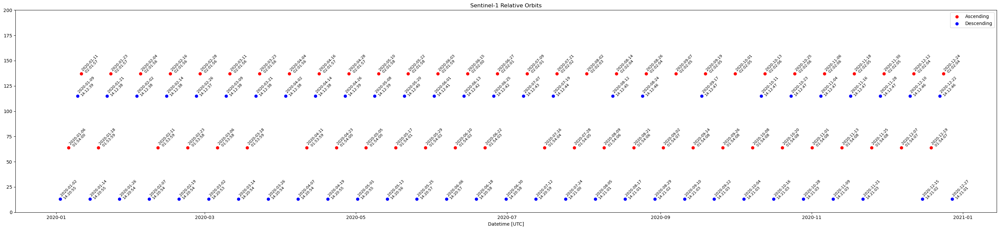

In [19]:
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2020-01-01',end_time='2020-12-31',polarization='vh',resolution=20) # special incrimnets? 320\f,ax=plt.subplots(figsize=(30,7))
f,ax=plt.subplots(figsize=(30,7))
s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)

In [20]:
#ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2020-01-01',end_time='2020-12-31',polarization='vv',resolution=20) # special incrimnets? 320

In [21]:
#f,ax=plt.subplots(figsize=(30,7))
#s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)

In [22]:
ts_ds = ts_ds.compute()

In [23]:
ts_ds

<xarray.DataArray 'stackstac-4da4dd23fc6a63d0a5aea0185e0395c9' (time: 114,
                                                                y: 557, x: 594)>
array([[[0.03524906, 0.03053968, 0.04073335, ..., 0.00226722,
         0.00279669, 0.00338821],
        [0.03310766, 0.01941623, 0.03837137, ..., 0.00300682,
         0.00350098, 0.00700743],
        [0.0399836 , 0.03158834, 0.03964006, ..., 0.00217964,
         0.00173913, 0.00865454],
        ...,
        [0.03977235, 0.03640584, 0.03634918, ..., 0.0359727 ,
         0.01521414, 0.00402752],
        [0.03497496, 0.02842454, 0.01488235, ..., 0.01514399,
         0.01790076, 0.02169172],
        [0.02778918, 0.02250128, 0.03553965, ..., 0.02082255,
         0.02105338, 0.01647415]],

       [[0.03464679, 0.04874556, 0.04121492, ..., 0.01234973,
         0.00789251, 0.00657139],
        [0.01551752, 0.04606234, 0.05085863, ..., 0.01452896,
         0.00667722, 0.00704495],
        [0.05862046, 0.0425262 , 0.04216542, ..., 0.02452837,
         0.0126475 , 0.00229451],
...
        [0.03211943, 0.03734231, 0.03855676, ..., 0.01255038,
         0.04150787, 0.03850413],
        [0.02641592, 0.02122176, 0.04974744, ..., 0.02411748,
         0.03261462, 0.02058831],
        [0.05226665, 0.0214225 , 0.02494968, ..., 0.00988419,
         0.01199972, 0.03021275]],

       [[0.03514813, 0.02963898, 0.04737133, ..., 0.00519495,
         0.00733435, 0.00626477],
        [0.07392275, 0.05950824, 0.0494948 , ..., 0.00408973,
         0.00510349, 0.00773379],
        [0.02979414, 0.04732092, 0.06389193, ..., 0.00262443,
         0.00317515, 0.00546246],
        ...,
        [0.02676613, 0.0673689 , 0.03884804, ..., 0.05697908,
         0.02682375, 0.00959457],
        [0.0445248 , 0.0426051 , 0.03902695, ..., 0.0203277 ,
         0.01215392, 0.01683594],
        [0.03708563, 0.03142808, 0.05115627, ..., 0.01336073,
         0.01421266, 0.01506859]]])
Coordinates: (12/39)
  * time                                   (time) datetime64[ns] 2020-01-02T1...
    id                                     (time) <U66 'S1B_IW_GRDH_1SDV_2020...
    band                                   <U2 'vh'
  * x                                      (x) float64 5.806e+05 ... 5.925e+05
  * y                                      (y) float64 5.41e+06 ... 5.398e+06
    sar:frequency_band                     <U1 'C'
    ...                                     ...
    sar:looks_equivalent_number            float64 4.4
    s1:orbit_source                        (time) <U6 'RESORB' ... 'RESORB'
    title                                  <U41 'VH: vertical transmit, horiz...
    description                            <U173 'Terrain-corrected gamma nau...
    raster:bands                           object {'nodata': -32768, 'data_ty...
    epsg                                   int64 32610
Attributes:
    spec:        RasterSpec(epsg=32610, bounds=(580600, 5398360, 592500, 5409...
    crs:         epsg:32610
    transform:   | 20.00, 0.00, 580600.00|\n| 0.00,-20.00, 5409520.00|\n| 0.0...
    resolution:  20

Text(0, 0.5, 'Snow Depth / SWE [cm]')

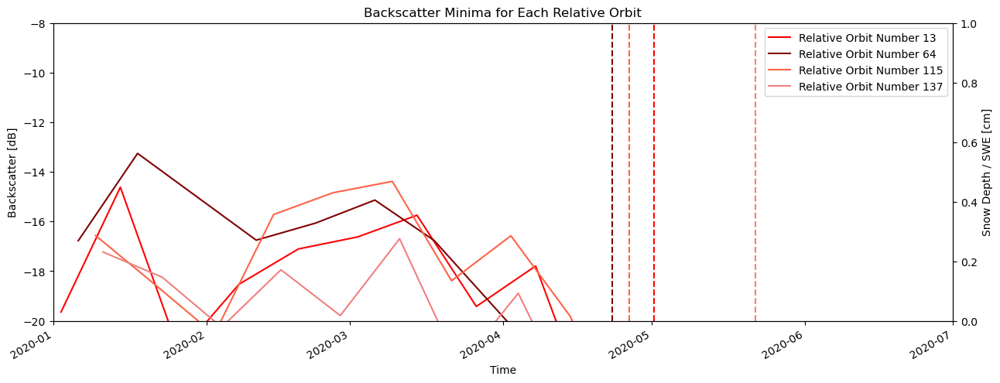

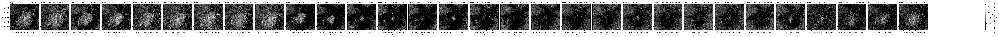

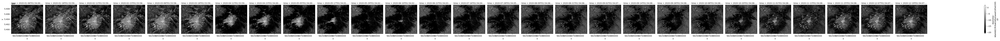

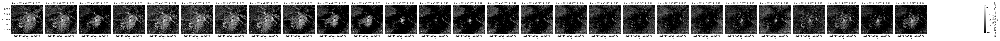

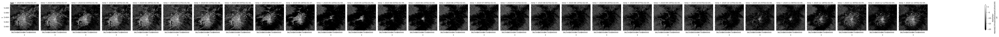

In [24]:
f,ax=plt.subplots(figsize=(15,5))
colors = iter(['red','maroon','tomato','lightcoral'])
for orbit in np.unique(ts_ds['sat:relative_orbit']):
    single_orbit = ts_ds[ts_ds['sat:relative_orbit']==orbit]
    single_orbit_db = 10*np.log10(single_orbit)
    single_orbit_db.plot(col='time',vmin=-20,vmax=1,cmap='gray')
    
    
    color = next(colors)
    single_orbit_db_mean = single_orbit_db.isel(x=slice(440,500),y=slice(240,300)).mean(dim=['x','y'])
    single_orbit_db_mean.plot(ax=ax,color=color,label=f'Relative Orbit Number {orbit}')
    ax.vlines(x=single_orbit_db_mean[single_orbit_db_mean.argmin()].time,ymin=-20,ymax=-8,linestyle='dashed',color=color)
ax.legend()
ax.set_ylim([-20,-8])
ax.set_xlim([pd.to_datetime('2020-01-01'),pd.to_datetime('2020-07-01')])
ax.set_ylabel('Backscatter [dB]')
ax.set_xlabel('Time')
ax.set_title('Backscatter Minima for Each Relative Orbit')

snwd_ax = ax.twinx()
snwd_ax.set_ylabel("Snow Depth / SWE [cm]")


In [25]:
runoffs = s1_rtc_bs_utils.get_runoff_onset(ts_ds,return_seperate_orbits=True)

[ 13  64 115 137]


In [26]:
runoffs.dt.dayofyear.std(dim='orbit').argmin()

<xarray.DataArray 'dayofyear' ()>
array(156)
Coordinates: (12/26)
    band                                   <U2 'vh'
    sar:frequency_band                     <U1 'C'
    sar:observation_direction              <U5 'right'
    platform                               <U11 'SENTINEL-1B'
    sar:looks_azimuth                      int64 1
    constellation                          <U10 'Sentinel-1'
    ...                                     ...
    sar:pixel_spacing_azimuth              int64 10
    sar:looks_equivalent_number            float64 4.4
    title                                  <U41 'VH: vertical transmit, horiz...
    description                            <U173 'Terrain-corrected gamma nau...
    raster:bands                           object {'nodata': -32768, 'data_ty...
    epsg                                   int64 32610

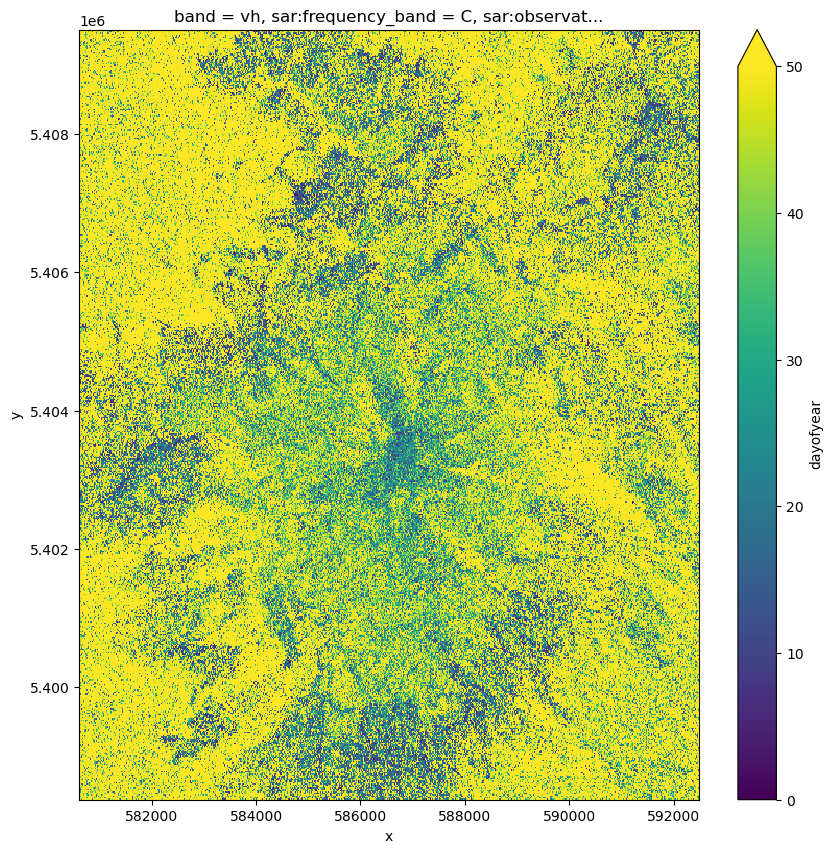

In [27]:
f,ax=plt.subplots(figsize=(10,10))
runoffs.dt.dayofyear.std(dim='orbit').plot(ax=ax,vmin=0,vmax=50)

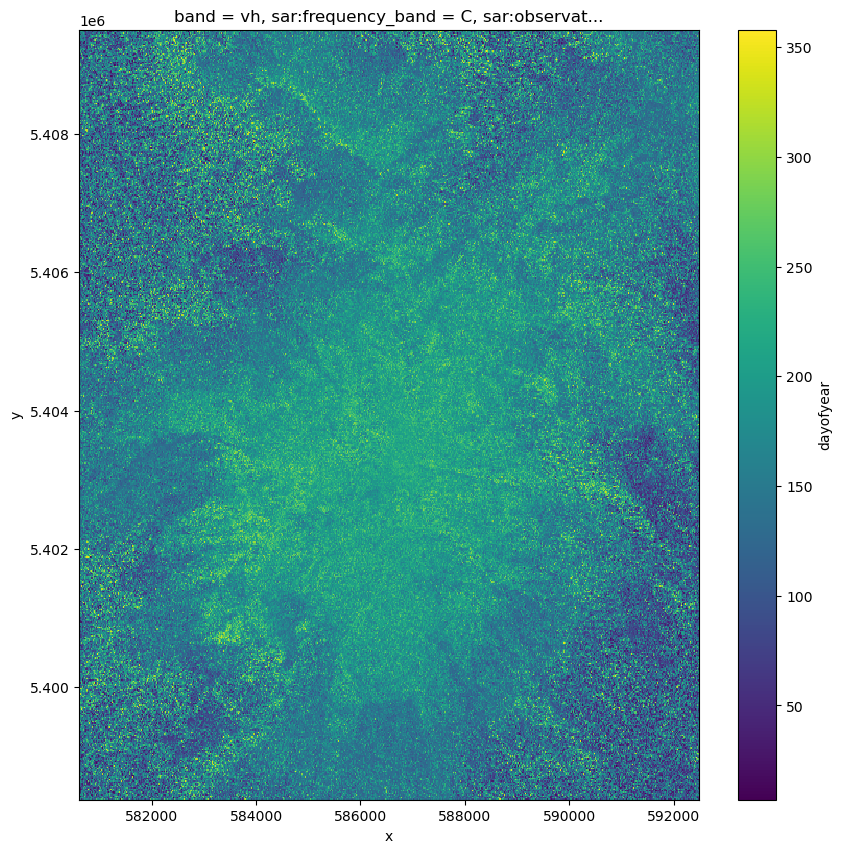

In [28]:
f,ax=plt.subplots(figsize=(10,10))
runoffs.dt.dayofyear.mean(dim='orbit').plot(ax=ax)

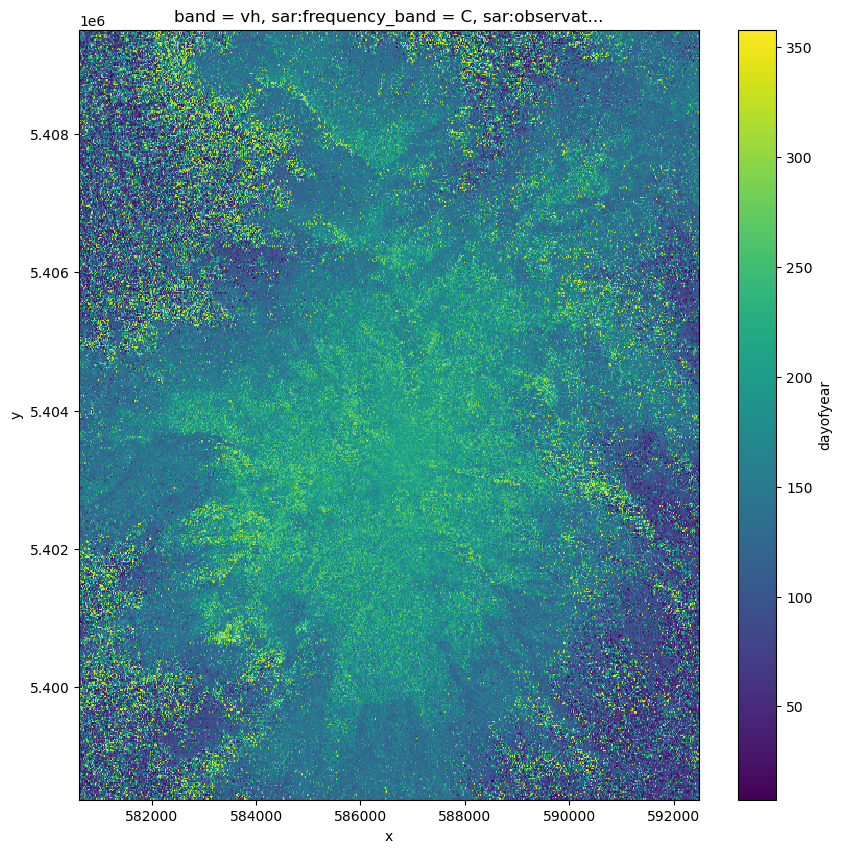

In [29]:
f,ax=plt.subplots(figsize=(10,10))
runoffs.dt.dayofyear.median(dim='orbit').plot(ax=ax)

In [31]:
runoffs

<xarray.DataArray 'time' (y: 557, x: 594, orbit: 4)>
array([[['2020-11-09T14:21:03.746428000',
         '2020-02-23T01:53:58.968132000',
         '2020-02-02T14:12:38.544031000',
         '2020-12-24T02:02:04.280096000'],
        ['2020-05-01T14:20:55.724928000',
         '2020-06-22T01:54:03.484345000',
         '2020-04-02T14:12:38.511965000',
         '2020-04-04T02:01:56.859075000'],
        ['2020-11-21T14:21:03.531577000',
         '2020-10-08T01:54:08.696310000',
         '2020-03-09T14:12:38.060516000',
         '2020-08-14T02:02:04.051853000'],
        ...,
        ['2020-06-06T14:20:57.802250000',
         '2020-05-29T01:54:02.223992000',
         '2020-04-26T14:12:39.424112000',
         '2020-04-28T02:01:57.838014000'],
        ['2020-04-19T14:20:55.121152000',
         '2020-11-25T01:54:08.253463000',
         '2020-06-13T14:12:42.154609000',
...
         '2020-11-13T01:54:08.562865000',
         '2020-02-02T14:12:38.544031000',
         '2020-10-13T02:02:06.123605000'],
        ['2020-03-02T14:20:53.953707000',
         '2020-01-06T01:54:00.349385000',
         '2020-02-14T14:12:38.197290000',
         '2020-02-28T02:01:56.114568000'],
        ...,
        ['2020-03-14T14:20:54.138232000',
         '2020-11-13T01:54:08.562865000',
         '2020-03-09T14:12:38.060516000',
         '2020-12-12T02:02:04.962739000'],
        ['2020-03-02T14:20:53.953707000',
         '2020-07-28T01:54:05.685947000',
         '2020-11-16T14:12:47.639315000',
         '2020-02-16T02:01:56.487602000'],
        ['2020-04-07T14:20:54.571279000',
         '2020-01-18T01:53:59.811056000',
         '2020-02-26T14:12:37.885753000',
         '2020-01-11T02:01:57.499676000']]], dtype='datetime64[ns]')
Coordinates: (12/40)
  * orbit                                  (orbit) int64 13 64 115 137
    time                                   (y, x) datetime64[ns] 2020-02-02T1...
    id                                     (y, x) <U66 'S1B_IW_GRDH_1SDV_2020...
    band                                   <U2 'vh'
  * x                                      (x) float64 5.806e+05 ... 5.925e+05
  * y                                      (y) float64 5.41e+06 ... 5.398e+06
    ...                                     ...
    sar:looks_equivalent_number            float64 4.4
    s1:orbit_source                        (y, x) <U6 'RESORB' ... 'RESORB'
    title                                  <U41 'VH: vertical transmit, horiz...
    description                            <U173 'Terrain-corrected gamma nau...
    raster:bands                           object {'nodata': -32768, 'data_ty...
    epsg                                   int64 32610

In [32]:
ts_ds_vv = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2020-01-01',end_time='2020-12-31',polarization='vv',resolution=20) # special incrimnets? 320
ts_ds_vv = ts_ds_vv.compute()

In [33]:
runoffs_vv = s1_rtc_bs_utils.get_runoff_onset(ts_ds_vv,return_seperate_orbits=True)

[ 13  64 115 137]


In [35]:
runoffs_all = xr.concat([runoffs,runoffs_vv], dim="orbit")

In [36]:
runoffs_all

<xarray.DataArray 'time' (y: 557, x: 594, orbit: 8)>
array([[['2020-11-09T14:21:03.746428000',
         '2020-02-23T01:53:58.968132000',
         '2020-02-02T14:12:38.544031000', ...,
         '2020-01-18T01:53:59.811056000',
         '2020-06-01T14:12:41.500412000',
         '2020-11-18T02:02:05.896153000'],
        ['2020-05-01T14:20:55.724928000',
         '2020-06-22T01:54:03.484345000',
         '2020-04-02T14:12:38.511965000', ...,
         '2020-03-18T01:53:59.141258000',
         '2020-03-09T14:12:38.060516000',
         '2020-10-13T02:02:06.123605000'],
        ['2020-11-21T14:21:03.531577000',
         '2020-10-08T01:54:08.696310000',
         '2020-03-09T14:12:38.060516000', ...,
         '2020-01-18T01:53:59.811056000',
         '2020-01-21T14:12:38.872609000',
         '2020-01-23T02:01:57.116532000'],
        ...,
        ['2020-06-06T14:20:57.802250000',
...
         '2020-01-11T02:01:57.499676000'],
        ...,
        ['2020-03-14T14:20:54.138232000',
         '2020-11-13T01:54:08.562865000',
         '2020-03-09T14:12:38.060516000', ...,
         '2020-02-23T01:53:58.968132000',
         '2020-03-21T14:12:38.235426000',
         '2020-12-24T02:02:04.280096000'],
        ['2020-03-02T14:20:53.953707000',
         '2020-07-28T01:54:05.685947000',
         '2020-11-16T14:12:47.639315000', ...,
         '2020-06-10T01:54:02.944057000',
         '2020-06-13T14:12:42.154609000',
         '2020-02-16T02:01:56.487602000'],
        ['2020-04-07T14:20:54.571279000',
         '2020-01-18T01:53:59.811056000',
         '2020-02-26T14:12:37.885753000', ...,
         '2020-01-18T01:53:59.811056000',
         '2020-04-14T14:12:38.896794000',
         '2020-01-11T02:01:57.499676000']]], dtype='datetime64[ns]')
Coordinates: (12/40)
  * orbit                                  (orbit) int64 13 64 115 ... 115 137
    time                                   (orbit, y, x) datetime64[ns] 2020-...
    id                                     (orbit, y, x) <U66 'S1B_IW_GRDH_1S...
    band                                   (orbit) <U2 'vh' 'vh' ... 'vv' 'vv'
  * x                                      (x) float64 5.806e+05 ... 5.925e+05
  * y                                      (y) float64 5.41e+06 ... 5.398e+06
    ...                                     ...
    sar:looks_equivalent_number            float64 4.4
    s1:orbit_source                        (orbit, y, x) <U6 'RESORB' ... 'RE...
    title                                  (orbit) <U41 'VH: vertical transmi...
    description                            (orbit) <U173 'Terrain-corrected g...
    raster:bands                           object {'nodata': -32768, 'data_ty...
    epsg                                   int64 32610

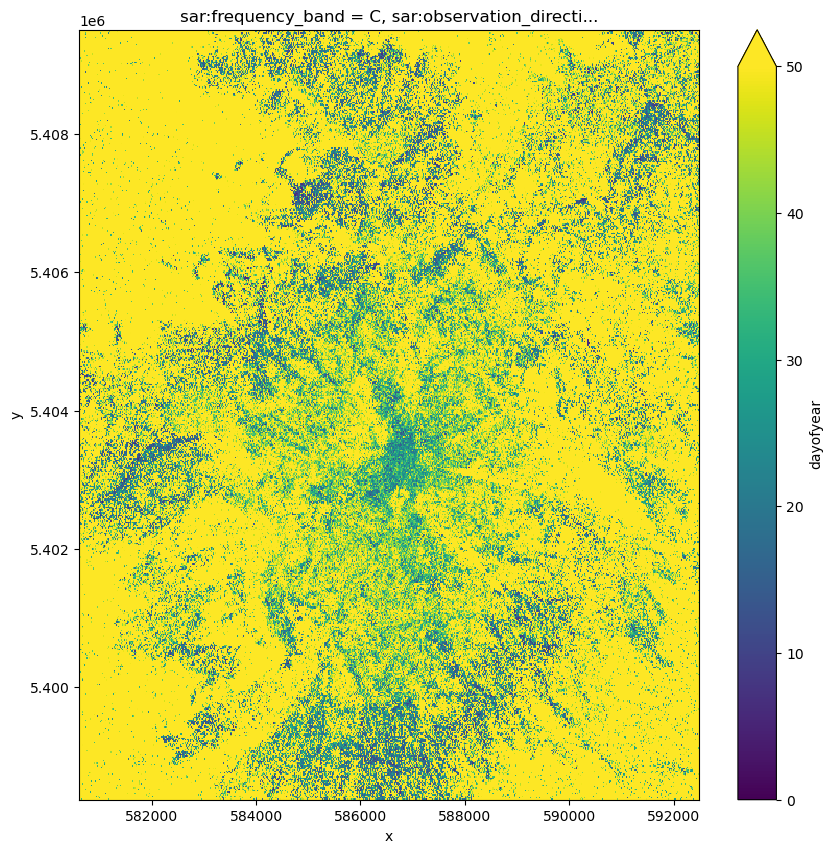

In [47]:
f,ax=plt.subplots(figsize=(10,10))
runoffs_all.dt.dayofyear.std(dim='orbit').plot(ax=ax,vmin=0,vmax=50)

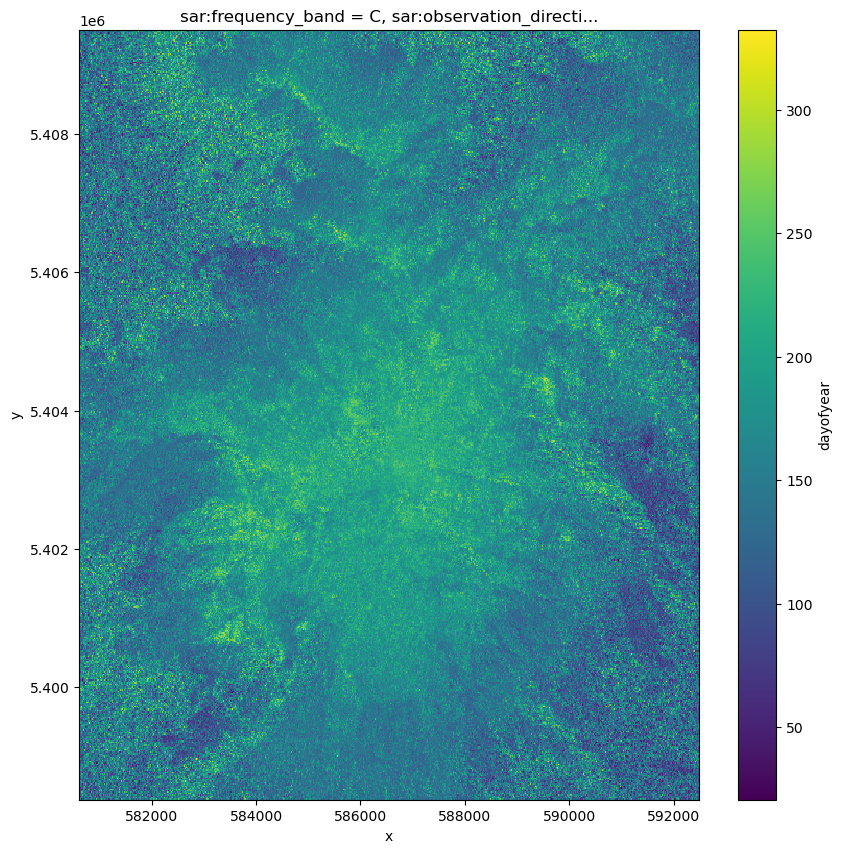

In [48]:
f,ax=plt.subplots(figsize=(10,10))
runoffs_all.dt.dayofyear.mean(dim='orbit').plot(ax=ax)

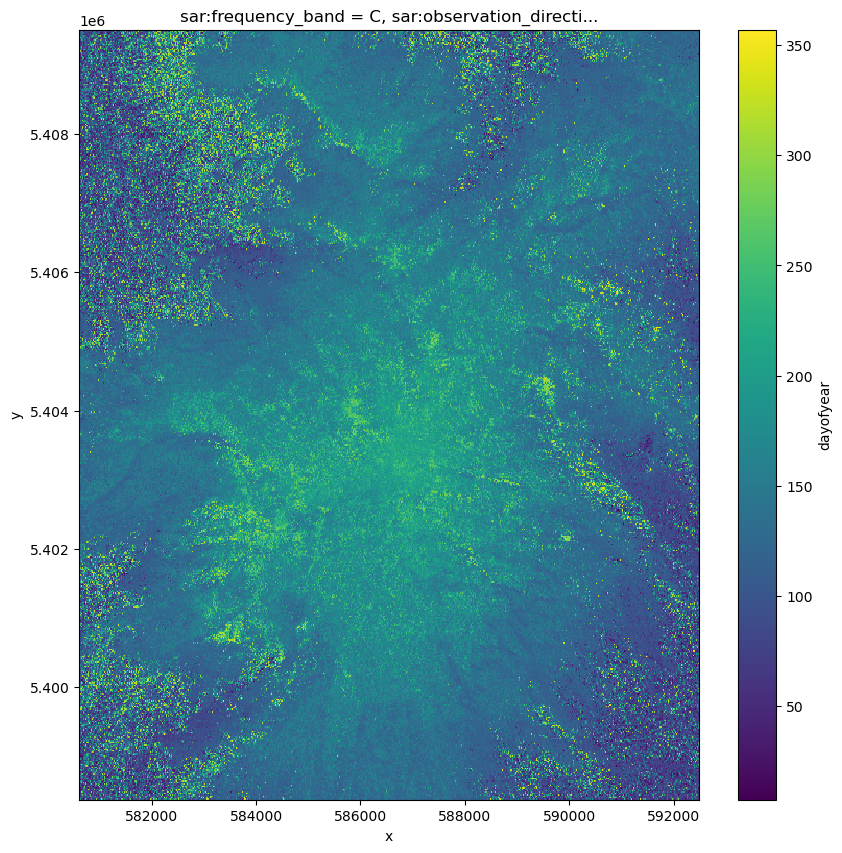

In [49]:
f,ax=plt.subplots(figsize=(10,10))
runoffs_all.dt.dayofyear.median(dim='orbit').plot(ax=ax)